In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
business = pd.read_json("yelp_academic_dataset_business.json", lines = True)

In [3]:
business.head(2)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,f9NumwFMBDn751xgFiRbNA,The Range At Lake Norman,10913 Bailey Rd,Cornelius,NC,28031,35.462724,-80.852612,3.5,36,1,"{'BusinessAcceptsCreditCards': 'True', 'BikePa...","Active Life, Gun/Rifle Ranges, Guns & Ammo, Sh...","{'Monday': '10:0-18:0', 'Tuesday': '11:0-20:0'..."
1,Yzvjg0SayhoZgCljUJRF9Q,"Carlos Santo, NMD","8880 E Via Linda, Ste 107",Scottsdale,AZ,85258,33.569404,-111.890264,5.0,4,1,"{'GoodForKids': 'True', 'ByAppointmentOnly': '...","Health & Medical, Fitness & Instruction, Yoga,...",None


In [4]:
# how many records do we have?

business.shape

(209393, 14)

In [5]:
# check for null values

business.isnull().sum().sort_values(ascending=False)

# hours, attributes, and categories (not bad, actually!)

hours           44843
attributes      29045
categories        524
is_open             0
review_count        0
stars               0
longitude           0
latitude            0
postal_code         0
state               0
city                0
address             0
name                0
business_id         0
dtype: int64

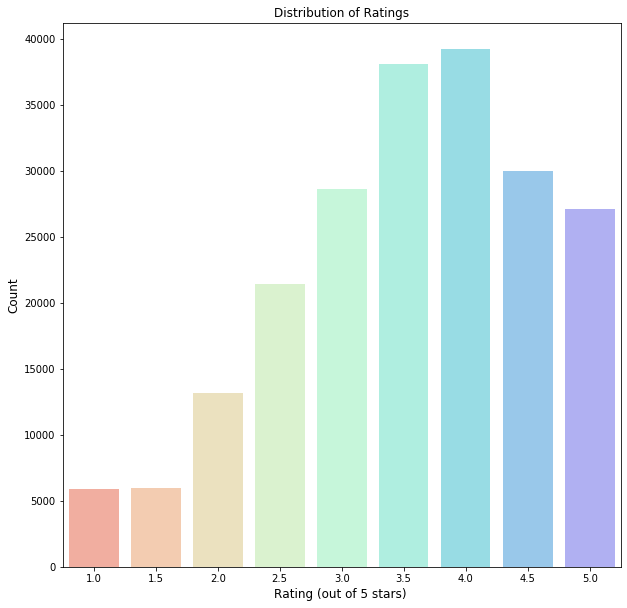

In [6]:
# let's take a look at the business by ratings

bus_by_ratings = business['stars'].value_counts().sort_index()

plt.figure(figsize = (10,10))

ax = sns.barplot(bus_by_ratings.index, bus_by_ratings.values, alpha = 0.5, palette = 'rainbow_r')
plt.title("Distribution of Ratings")
plt.ylabel('Count', fontsize = 12)
plt.xlabel('Rating (out of 5 stars) ', fontsize = 12)

plt.show()

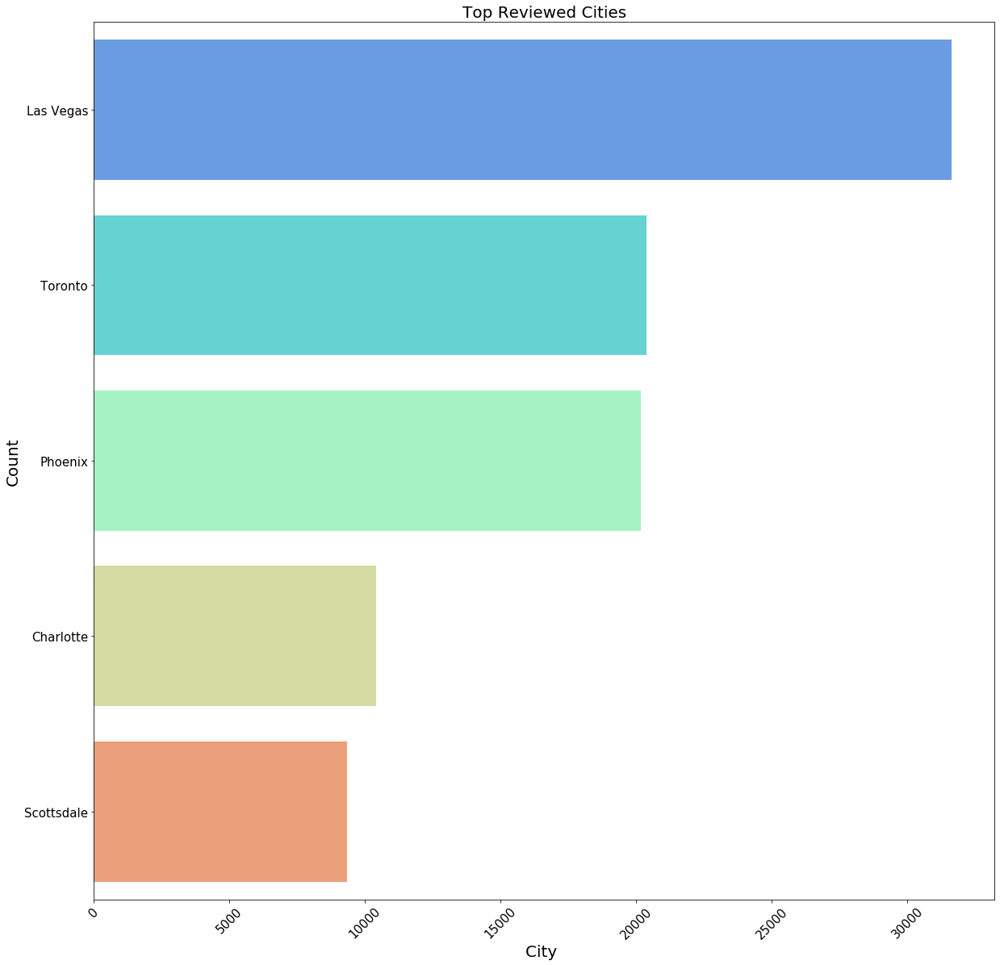

In [9]:
# what are the top cities reviewed?
pd.set_option('display.max_rows', None)

bus_cities = business['city'].value_counts().sort_values(ascending = False).iloc[0:5]

plt.figure(figsize = (20, 20))

ax = sns.barplot(y = bus_cities.index, x = bus_cities.values, alpha = 0.8, palette = 'rainbow')
plt.title("Top Reviewed Cities", fontsize = 20)
plt.xticks(fontsize = 15, rotation = 45)
plt.yticks(fontsize = 15)
plt.ylabel('Count', fontsize = 20)
plt.xlabel('City ', fontsize = 20)

plt.show()


In [81]:
# las vegas is the most reviewed city - what restaurants?

las_vegas = business.loc[business['city'] == 'Las Vegas']

las_vegas = las_vegas[['name', 'review_count', 'city', 'stars']].sort_values(ascending = False, by="review_count")[0:20]

las_vegas

,name,review_count,city,stars
81545,Bacchanal Buffet,10129,Las Vegas,4.0
118008,Mon Ami Gabi,9264,Las Vegas,4.0
147379,Wicked Spoon,7383,Las Vegas,3.5
83020,Hash House A Go Go,6751,Las Vegas,4.0
201975,Gordon Ramsay BurGR,5494,Las Vegas,4.0
95962,Earl of Sandwich,5232,Las Vegas,4.5
22754,Yardbird Southern Table & Bar,4828,Las Vegas,4.5
205740,The Buffet At Wynn,4803,Las Vegas,3.5
145294,Secret Pizza,4803,Las Vegas,4.0
77432,The Cosmopolitan of Las Vegas,4740,Las Vegas,4.0


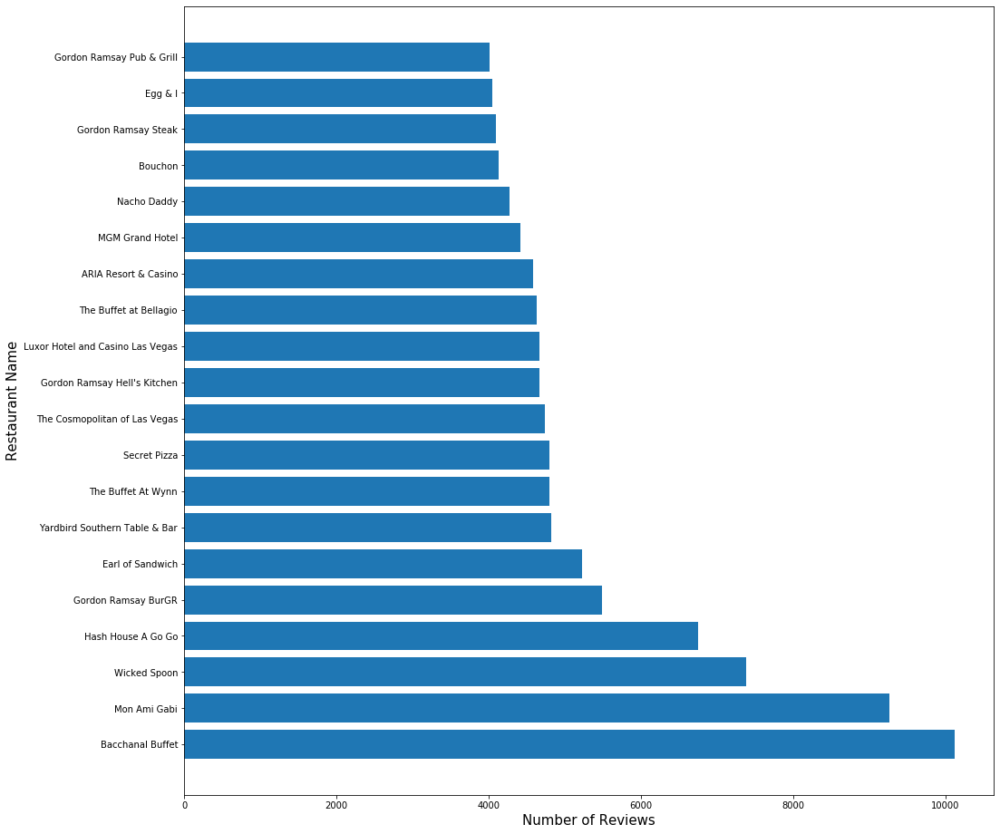

In [163]:
fig, ax = plt.subplots(figsize = (16, 16))

ax.barh(las_vegas['name'], las_vegas['review_count'], align = 'center')
ax.set_yticklabels(las_vegas['name'])
ax.set_ylabel('Restaurant Name', fontsize = 15)
ax.set_xlabel('Number of Reviews', fontsize = 15)

plt.show()

In [83]:
# toronto is the second most reviewed city - what restaurants?

toronto = business.loc[business['city'] == 'Toronto']

toronto[['name', 'review_count', 'city', 'stars']].sort_values(ascending = False, by = "review_count")[0:20]

,name,review_count,city,stars
65694,Pai Northern Thai Kitchen,2758,Toronto,4.5
183740,KINKA IZAKAYA ORIGINAL,1592,Toronto,4.0
143305,Khao San Road,1542,Toronto,4.0
133959,Seven Lives Tacos Y Mariscos,1285,Toronto,4.5
172038,Banh Mi Boys,1097,Toronto,4.5
158023,Momofuku Noodle Bar,1010,Toronto,3.0
170950,Uncle Tetsu's Japanese Cheesecake,1009,Toronto,3.5
89916,Bang Bang Ice Cream and Bakery,984,Toronto,4.0
97579,Gusto 101,956,Toronto,4.0
27483,Salad King Restaurant,948,Toronto,3.5


In [86]:
# can we break things down by category?

business['categories'] # separated by commas

0         Active Life, Gun/Rifle Ranges, Guns & Ammo, Sh...
1         Health & Medical, Fitness & Instruction, Yoga,...
2                          Pets, Pet Services, Pet Groomers
3         Hardware Stores, Home Services, Building Suppl...
4         Home Services, Plumbing, Electricians, Handyma...
5         Auto Repair, Automotive, Oil Change Stations, ...
6         Dry Cleaning & Laundry, Local Services, Laundr...
7         Auto Repair, Oil Change Stations, Automotive, ...
8         Ethnic Food, Food Trucks, Specialty Food, Impo...
9         Martial Arts, Gyms, Fitness & Instruction, Act...
10                  Contractors, Landscaping, Home Services
11                                  Automotive, Auto Repair
12                Desserts, Food, Ice Cream & Frozen Yogurt
13               Contractors, Home Services, Local Services
14                                   Beauty & Spas, Tanning
15                             Local Services, Self Storage
16                           Shopping, S

In [164]:
bus_cats = business.categories.str.split(",", expand = True)
bus_cats = bus_cats.value_counts().sort_values(ascending = False).iloc[0:20]

AttributeError: 'DataFrame' object has no attribute 'value_counts'

In [122]:
bus_cats.head(2)

Restaurants                  19456
Food                          8539
Shopping                      8516
Beauty & Spas                 6304
Home Services                 6282
Health & Medical              5249
Automotive                    4657
Local Services                3825
Nightlife                     2796
Active Life                   2454
Event Planning & Services     2352
Pizza                         2301
Bars                          2199
Coffee & Tea                  2158
Hair Salons                   2091
Fast Food                     2043
Sandwiches                    1932
Auto Repair                   1923
Nail Salons                   1786
Hotels & Travel               1754
Name: 0, dtype: int64

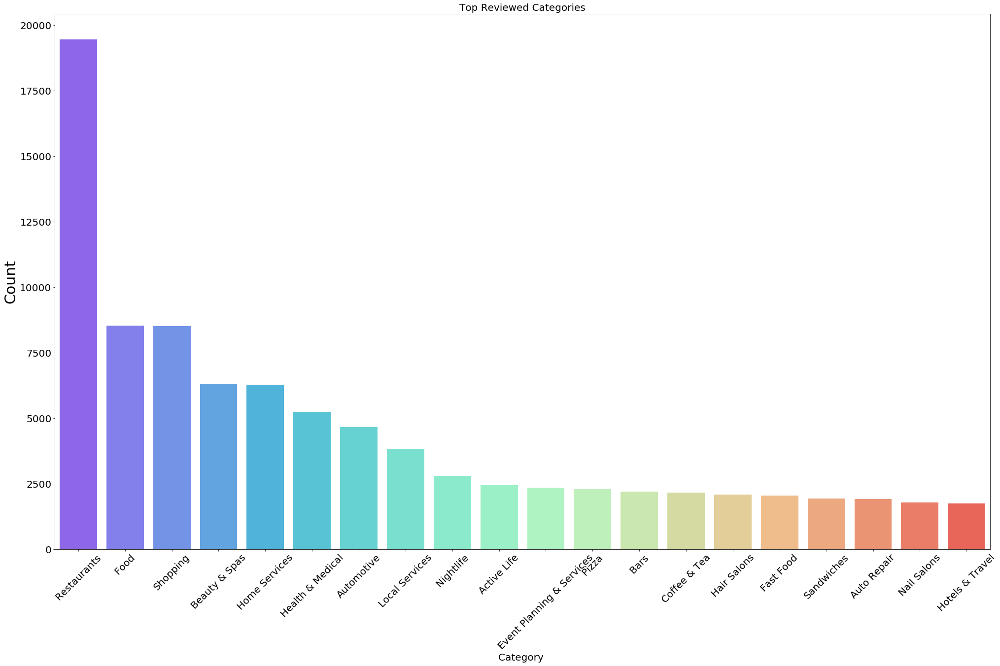

In [123]:
plt.figure(figsize = (34, 20))

ax = sns.barplot(bus_cats.index, bus_cats.values, alpha = 0.8, palette = 'rainbow')
plt.title("Top Reviewed Categories", fontsize = 20)
plt.ylabel('Count', fontsize = 30)
plt.xlabel('Category ', fontsize = 20)
plt.xticks(rotation = 45, fontsize = 20)
plt.yticks(fontsize = 20)


plt.show()

In [124]:
# write to CSV to import to HDFS / hive -- JSON not pulling in correctly and having problems with serde for json problems
business.to_csv('yelp_business.csv')

In [130]:
# compare open and closed businesses

open_bus = business.loc[business.is_open == 1]
closed_bus = business.loc[business.is_open == 0]

<Figure size 2880x1440 with 0 Axes>

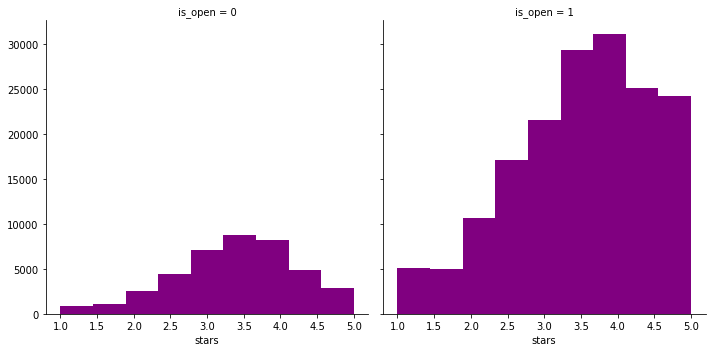

In [154]:
plt.figure(figsize = (40, 20))

ax = sns.FacetGrid(business, col = "is_open", height = 5).map(plt.hist, "stars",  color = "purple", bins = 9)

plt.show()

In [155]:
business['stars'].unique()

array([3.5, 5. , 2.5, 4.5, 3. , 4. , 1.5, 2. , 1. ])